# 🩺 Skin Cancer Binary Classification using EfficientNet-B0

## Project Overview

This notebook develops a deep learning model for **binary skin cancer classification**
using the **HAM10000 dataset**.

The model classifies dermoscopic skin lesion images into:

- **Benign (0)**
- **Malignant (1)**

### Dataset

HAM10000 (Human Against Machine with 10,015 Dermatoscopic Images)

### Classes

Malignant
- Melanoma (mel)
- Basal Cell Carcinoma (bcc)
- Actinic Keratoses (akiec)

Benign
- Melanocytic Nevus (nv)
- Benign Keratosis (bkl)
- Dermatofibroma (df)
- Vascular Lesion (vasc)

---

## Deep Learning Model

- EfficientNet-B0 (ImageNet Pretrained)
- TensorFlow 2.x
- Transfer Learning
- Fine Tuning
- Mixed Precision Training

---

## Training Configuration

Image Size : 224×224

Epochs : 60

Batch Size : 32

Optimizer : AdamW

Loss Function :
Binary Crossentropy

Metrics

- Accuracy
- Precision
- Recall
- AUC

---

## Output

The notebook automatically generates

- Dataset Analysis
- EDA Graphs
- Training Curves
- ROC Curve
- Precision Recall Curve
- Confusion Matrix
- Classification Report
- Prediction Function

In [1]:
# Uncomment if needed

# !pip install tensorflow==2.17
# !pip install scikit-learn
# !pip install pandas
# !pip install matplotlib
# !pip install seaborn
# !pip install opencv-python
# !pip install pillow
# !pip install tqdm

# SkinNova - Advanced Training Notebook (v2)

**Project:** SkinNova: A Novel Deep Learning Framework for Skin Cancer Detection and Explainable Diagnosis
**Dataset:** HAM10000 (Skin Cancer MNIST)
**Task:** Seven-class skin lesion classification
**Model:** Hybrid EfficientNetV2B0 (local CNN features) + lightweight Transformer encoder (global context)

### What changed vs. the previous notebook version
1. **Preprocessing is cached, not recomputed every epoch.** Hair removal (Dull Razor), CLAHE and bilateral
   filtering now run once per image and are saved to disk. Training reads the small cached JPEGs directly,
   which removes the single biggest training bottleneck in the original notebook.
2. **Hybrid CNN + Transformer model.** In addition to EfficientNetV2B0's convolutional features, the feature
   map is tokenized and passed through a small Transformer encoder for global context, then fused with the
   CNN's pooled features before classification — matching the "hybrid deep learning" idea in the project README.
3. **Grad-CAM is fixed.** EfficientNetV2B0 is itself a Keras Functional model, so its layers are addressed
   directly with `get_layer()` — no fragile nested-submodel search needed.
4. **LIME explanations are actually implemented**, not just listed as a planned feature.
5. **Early stopping, LR scheduling, mixed precision, and a full evaluation + reporting suite** (CSV + graphs)
   are included, matching the metrics your original notebook produced.

> **Honesty note:** U-Net lesion segmentation is **not** included. HAM10000 does not ship pixel-level lesion
> masks, so a real segmentation stage would require pulling in the separate ISIC segmentation task's masks.
> Faking this step would be worse than leaving it as documented future work.

> **Medical disclaimer:** This notebook is a research/educational tool. It is **not** a diagnostic device and
> must never replace professional dermatological evaluation.


In [2]:
# ============================================
# Import Required Libraries
# ============================================

import os
import random
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image
import cv2

from tqdm import tqdm

from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
    roc_curve,
    roc_auc_score,
    precision_recall_curve,
    auc
)

import tensorflow as tf

from tensorflow.keras import mixed_precision
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input,
    Dense,
    Dropout,
    GlobalAveragePooling2D,
    BatchNormalization
)

from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint,
    CSVLogger
)

from tensorflow.keras.optimizers import Adam

print("="*60)
print("TensorFlow Version :", tf.__version__)
print("NumPy Version      :", np.__version__)
print("Pandas Version     :", pd.__version__)
print("="*60)

TensorFlow Version : 2.21.0
NumPy Version      : 2.5.1
Pandas Version     : 3.0.3


In [3]:
# ============================================
# GPU Configuration
# ============================================

gpus = tf.config.list_physical_devices('GPU')

if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)

        mixed_precision.set_global_policy('mixed_float16')

        print("GPU Found")
        print("Mixed Precision Enabled")

    except RuntimeError as e:
        print(e)

else:
    print("GPU Not Found")
    print("Training will use CPU")

GPU Not Found
Training will use CPU


In [4]:
# ============================================
# Random Seed
# ============================================

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

AUTO = tf.data.AUTOTUNE

print("Random Seed :", SEED)

Random Seed : 42


## 4. Project Configuration

Change `DATASET_DIR` and `OUTPUT_DIR` to match your environment.

Expected dataset folder structure (matches your uploaded layout):
```text
Dataset/
├── HAM10000_metadata.csv
├── HAM10000_images_part_1/
├── HAM10000_images_part_2/
├── hmnist_8_8_L.csv
├── hmnist_8_8_RGB.csv
├── hmnist_28_28_L.csv
└── hmnist_28_28_RGB.csv
```
Only `HAM10000_metadata.csv` and the two image folders are used here — the `hmnist_*` CSVs are
pre-flattened/low-resolution versions of the same images and are not needed for this pipeline.


In [5]:
# ============================================
# Dataset Paths
# ============================================

DATASET_PATH = "Dataset"

IMAGE_DIR1 = os.path.join(DATASET_PATH, "HAM10000_images_part_1")
IMAGE_DIR2 = os.path.join(DATASET_PATH, "HAM10000_images_part_2")

CSV_PATH = os.path.join(DATASET_PATH, "HAM10000_metadata.csv")

MODEL_PATH = "saved_model"

os.makedirs(MODEL_PATH, exist_ok=True)

print("Dataset :", DATASET_PATH)
print("CSV :", CSV_PATH)

Dataset : Dataset
CSV : Dataset\HAM10000_metadata.csv


In [6]:
# ============================================
# Load Metadata
# ============================================

df = pd.read_csv(CSV_PATH)

print("Dataset Shape :", df.shape)

df.head()

Dataset Shape : (10015, 7)


,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


In [7]:
# ============================================
# Binary Label Mapping
# ============================================

malignant = [
    "mel",
    "bcc",
    "akiec"
]

df["label"] = df["dx"].apply(
    lambda x: 1 if x in malignant else 0
)

df["binary_class"] = df["label"].map({
    0: "Benign",
    1: "Malignant"
})

print(df[["dx","binary_class"]].head())

print("\nClass Distribution")

print(df["binary_class"].value_counts())

    dx binary_class
0  bkl       Benign
1  bkl       Benign
2  bkl       Benign
3  bkl       Benign
4  bkl       Benign

Class Distribution
binary_class
Benign       8061
Malignant    1954
Name: count, dtype: int64


In [8]:
# ============================================
# Image Path Generation
# ============================================

def get_image_path(image_id):

    path1 = os.path.join(
        IMAGE_DIR1,
        image_id + ".jpg"
    )

    path2 = os.path.join(
        IMAGE_DIR2,
        image_id + ".jpg"
    )

    if os.path.exists(path1):
        return path1

    elif os.path.exists(path2):
        return path2

    else:
        return None


df["image_path"] = df["image_id"].apply(get_image_path)

print("Missing Images :",
      df["image_path"].isnull().sum())

df = df.dropna()

df.reset_index(drop=True, inplace=True)

print("Dataset After Cleaning :", df.shape)

Missing Images : 0
Dataset After Cleaning : (9958, 10)


In [9]:
# ============================================
# Dataset Information
# ============================================

print("="*60)

print(df.info())

print("="*60)

display(df.describe(include="all"))

print("="*60)

display(df.head())

<class 'pandas.DataFrame'>
RangeIndex: 9958 entries, 0 to 9957
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     9958 non-null   str    
 1   image_id      9958 non-null   str    
 2   dx            9958 non-null   str    
 3   dx_type       9958 non-null   str    
 4   age           9958 non-null   float64
 5   sex           9958 non-null   str    
 6   localization  9958 non-null   str    
 7   label         9958 non-null   int64  
 8   binary_class  9958 non-null   str    
 9   image_path    9958 non-null   str    
dtypes: float64(1), int64(1), str(8)
memory usage: 778.1 KB
None


,lesion_id,image_id,dx,dx_type,age,sex,localization,label,binary_class,image_path
count,9958,9958,9958,9958,9958.000000,9958,9958,9958.000000,9958,9958
unique,7418,9958,7,4,NaN,3,15,NaN,2,9958
top,HAM_0003789,ISIC_0027419,nv,histo,NaN,male,back,NaN,Benign,Dataset\HAM10000_images_part_1\ISIC_0027419.jpg
freq,6,1,6660,5332,NaN,5400,2192,NaN,8006,1
mean,NaN,NaN,NaN,NaN,51.863828,NaN,NaN,0.196023,NaN,NaN
std,NaN,NaN,NaN,NaN,16.968614,NaN,NaN,0.397006,NaN,NaN
min,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN
25%,NaN,NaN,NaN,NaN,40.000000,NaN,NaN,0.000000,NaN,NaN
50%,NaN,NaN,NaN,NaN,50.000000,NaN,NaN,0.000000,NaN,NaN
75%,NaN,NaN,NaN,NaN,65.000000,NaN,NaN,0.000000,NaN,NaN


,lesion_id,image_id,dx,dx_type,age,sex,localization,label,binary_class,image_path
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,0,Benign,Dataset\HAM10000_images_part_1\ISIC_0027419.jpg
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,0,Benign,Dataset\HAM10000_images_part_1\ISIC_0025030.jpg
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,0,Benign,Dataset\HAM10000_images_part_1\ISIC_0026769.jpg
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,0,Benign,Dataset\HAM10000_images_part_1\ISIC_0025661.jpg
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,0,Benign,Dataset\HAM10000_images_part_2\ISIC_0031633.jpg


Missing Values


lesion_id       0
image_id        0
dx              0
dx_type         0
age             0
sex             0
localization    0
label           0
binary_class    0
image_path      0
dtype: int64

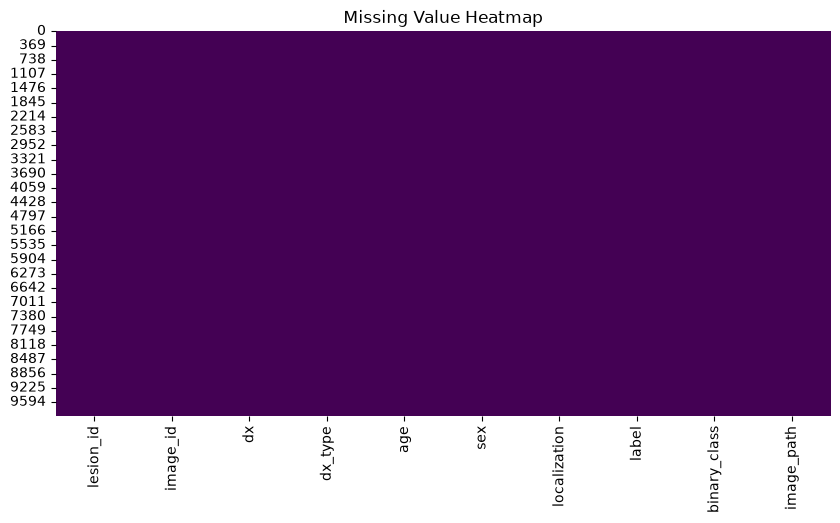

In [10]:
# ============================================
# Missing Value Analysis
# ============================================

print("="*60)
print("Missing Values")
print("="*60)

missing = df.isnull().sum()

display(missing)

plt.figure(figsize=(10,5))

sns.heatmap(
    df.isnull(),
    cbar=False,
    cmap="viridis"
)

plt.title("Missing Value Heatmap")
plt.show()

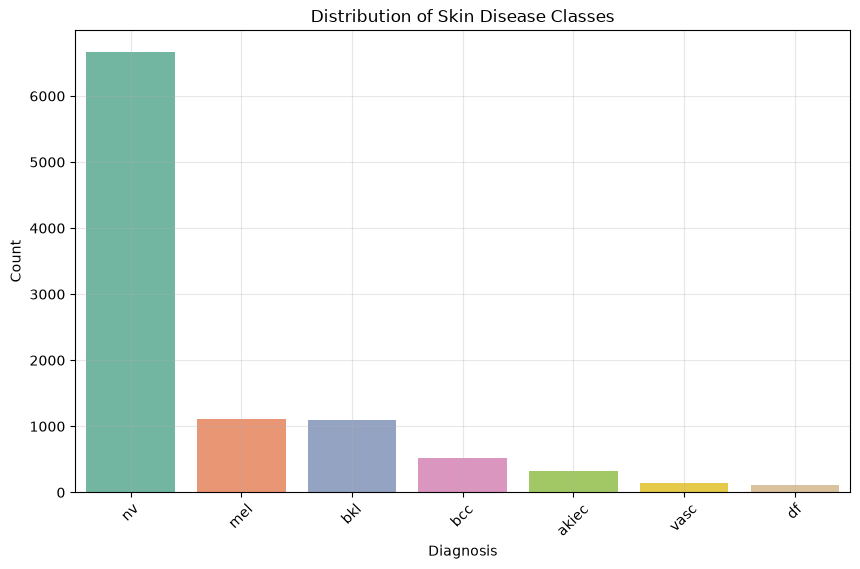

dx
nv       6660
mel      1111
bkl      1089
bcc       514
akiec     327
vasc      142
df        115
Name: count, dtype: int64


In [11]:
# ============================================
# Original Diagnosis Distribution
# ============================================

plt.figure(figsize=(10,6))

sns.countplot(
    data=df,
    x="dx",
    order=df["dx"].value_counts().index,
    palette="Set2"
)

plt.title("Distribution of Skin Disease Classes")

plt.xlabel("Diagnosis")

plt.ylabel("Count")

plt.xticks(rotation=45)

plt.grid(alpha=0.3)

plt.show()

print(df["dx"].value_counts())

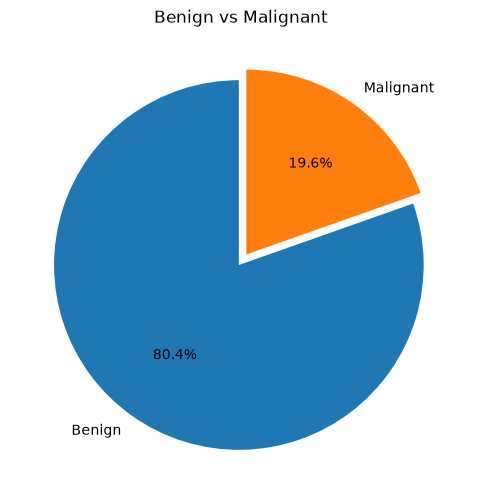

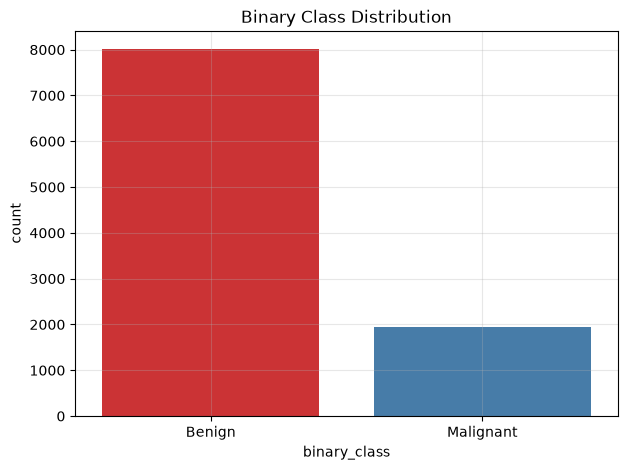

In [12]:
# ============================================
# Binary Distribution
# ============================================

plt.figure(figsize=(6,6))

df["binary_class"].value_counts().plot(
    kind="pie",
    autopct="%1.1f%%",
    startangle=90,
    explode=[0.02,0.05]
)

plt.ylabel("")

plt.title("Benign vs Malignant")

plt.show()

plt.figure(figsize=(7,5))

sns.countplot(
    data=df,
    x="binary_class",
    palette="Set1"
)

plt.title("Binary Class Distribution")

plt.grid(alpha=0.3)

plt.show()

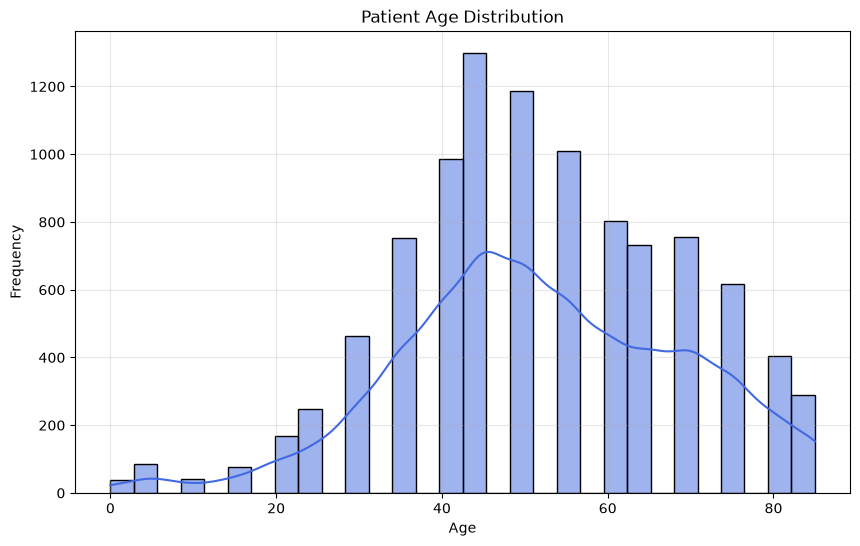

In [13]:
# ============================================
# Age Distribution
# ============================================

plt.figure(figsize=(10,6))

sns.histplot(
    data=df,
    x="age",
    bins=30,
    kde=True,
    color="royalblue"
)

plt.title("Patient Age Distribution")

plt.xlabel("Age")

plt.ylabel("Frequency")

plt.grid(alpha=0.3)

plt.show()

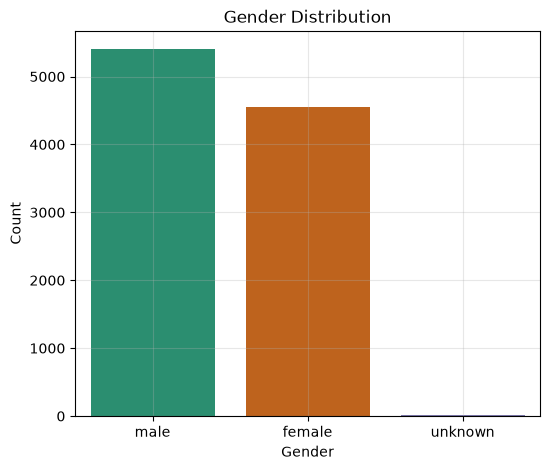

In [14]:
# ============================================
# Gender Distribution
# ============================================

plt.figure(figsize=(6,5))

sns.countplot(
    data=df,
    x="sex",
    palette="Dark2"
)

plt.title("Gender Distribution")

plt.xlabel("Gender")

plt.ylabel("Count")

plt.grid(alpha=0.3)

plt.show()

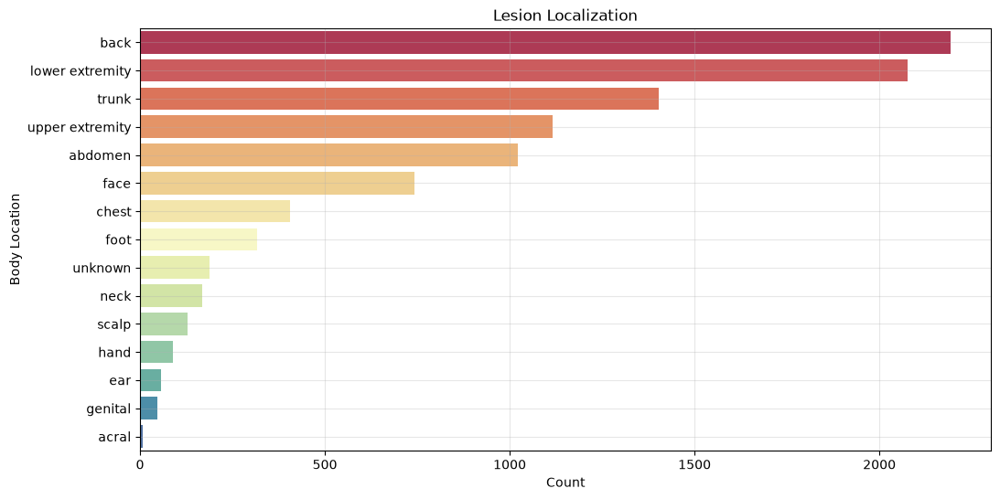

In [15]:
# ============================================
# Lesion Localization
# ============================================

plt.figure(figsize=(12,6))

sns.countplot(
    data=df,
    y="localization",
    order=df["localization"].value_counts().index,
    palette="Spectral"
)

plt.title("Lesion Localization")

plt.xlabel("Count")

plt.ylabel("Body Location")

plt.grid(alpha=0.3)

plt.show()

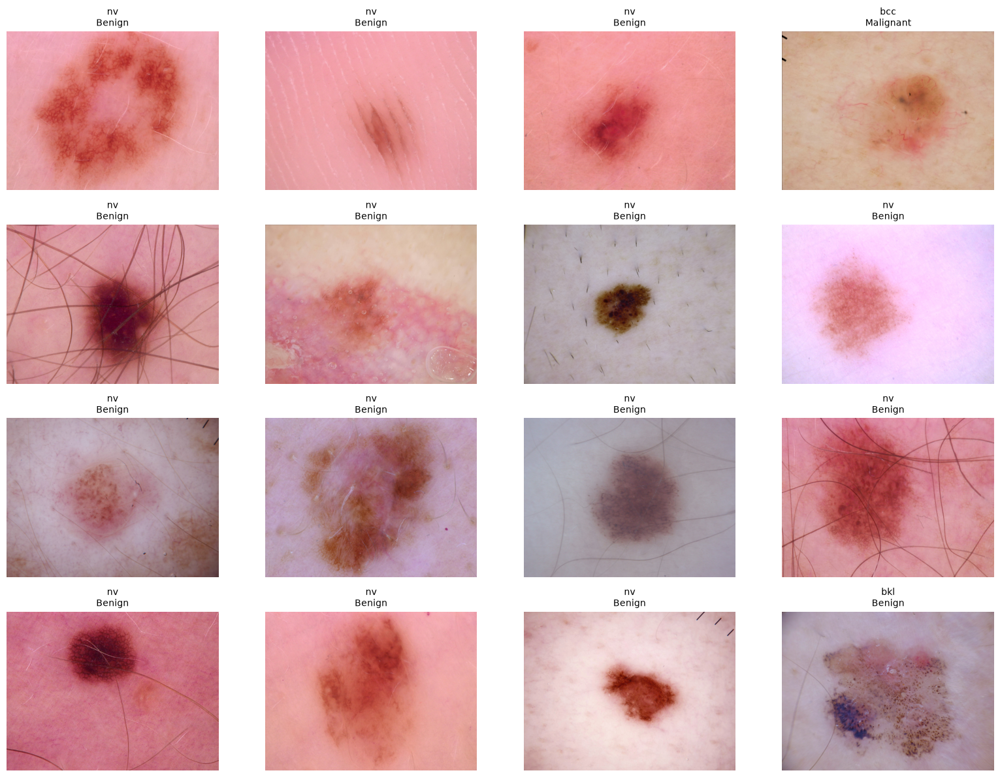

In [16]:
# ============================================
# Sample Images
# ============================================

plt.figure(figsize=(16,12))

sample = df.sample(16, random_state=42)

for i, (_, row) in enumerate(sample.iterrows()):

    image = cv2.imread(row["image_path"])

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.subplot(4,4,i+1)

    plt.imshow(image)

    plt.title(
        f'{row["dx"]}\n{row["binary_class"]}',
        fontsize=10
    )

    plt.axis("off")

plt.tight_layout()

plt.show()

100%|██████████| 9958/9958 [00:27<00:00, 366.17it/s]


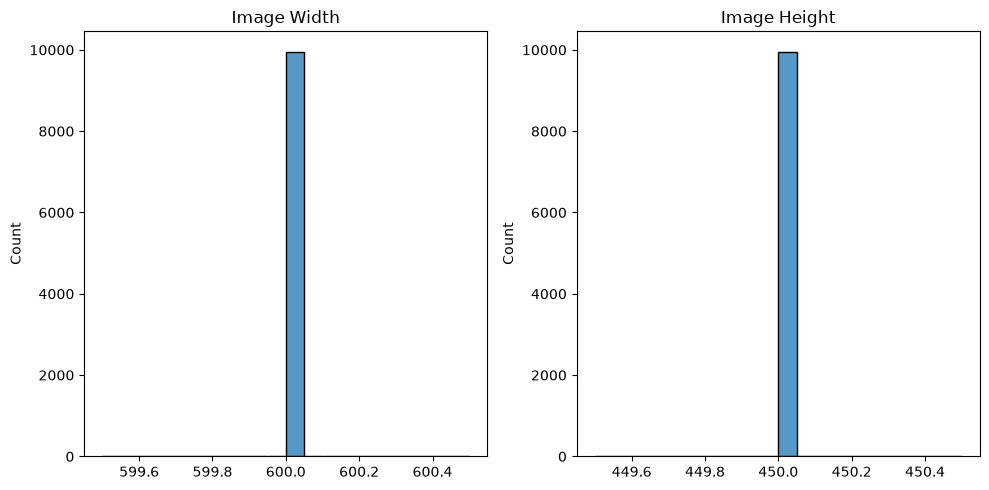

Average Width : 600.0
Average Height: 450.0


In [17]:
# ============================================
# Image Size Analysis
# ============================================

widths = []
heights = []

for path in tqdm(df["image_path"]):

    image = Image.open(path)

    widths.append(image.size[0])

    heights.append(image.size[1])

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)

sns.histplot(widths,bins=20)

plt.title("Image Width")

plt.subplot(1,2,2)

sns.histplot(heights,bins=20)

plt.title("Image Height")

plt.tight_layout()

plt.show()

print("Average Width :", np.mean(widths))
print("Average Height:", np.mean(heights))

In [18]:
# ============================================
# Train Validation Test Split
# ============================================

train_df, test_df = train_test_split(
    df,
    test_size=0.15,
    stratify=df["label"],
    random_state=42
)

train_df, valid_df = train_test_split(
    train_df,
    test_size=0.15,
    stratify=train_df["label"],
    random_state=42
)

print("="*60)

print("Training :", len(train_df))

print("Validation :", len(valid_df))

print("Testing :", len(test_df))

print("="*60)

Training : 7194
Validation : 1270
Testing : 1494


In [19]:
# ============================================
# Compute Class Weights
# ============================================

weights = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(train_df["label"]),
    y=train_df["label"]
)

class_weights = {
    0: weights[0],
    1: weights[1]
}

print(class_weights)

{0: np.float64(0.6218879668049793), 1: np.float64(2.551063829787234)}


In [20]:
# ============================================
# Training Configuration
# ============================================

IMG_SIZE = 224
BATCH_SIZE = 32
EPOCH_STAGE1 = 20
EPOCH_STAGE2 = 40

AUTOTUNE = tf.data.AUTOTUNE

print("="*60)
print(f"Image Size      : {IMG_SIZE} x {IMG_SIZE}")
print(f"Batch Size      : {BATCH_SIZE}")
print(f"Stage 1 Epochs  : {EPOCH_STAGE1}")
print(f"Stage 2 Epochs  : {EPOCH_STAGE2}")
print(f"Total Epochs    : {EPOCH_STAGE1 + EPOCH_STAGE2}")
print("="*60)

Image Size      : 224 x 224
Batch Size      : 32
Stage 1 Epochs  : 20
Stage 2 Epochs  : 40
Total Epochs    : 60


In [21]:
from tensorflow.keras.applications.efficientnet import preprocess_input

# ============================================
# Load and Preprocess Image
# ============================================

def preprocess_image(path, label):

    image = tf.io.read_file(path)

    image = tf.image.decode_jpeg(image, channels=3)

    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))

    image = tf.cast(image, tf.float32)

    # EfficientNet preprocessing
    image = preprocess_input(image)

    return image, tf.cast(label, tf.float32)

In [22]:
# ============================================
# Data Augmentation
# ============================================

data_augmentation = tf.keras.Sequential([

    tf.keras.layers.RandomFlip("horizontal"),

    tf.keras.layers.RandomRotation(0.10),

    tf.keras.layers.RandomZoom(0.10),

    tf.keras.layers.RandomContrast(0.10),

    tf.keras.layers.RandomTranslation(
        height_factor=0.05,
        width_factor=0.05
    )

], name="augmentation")

In [23]:
# ============================================
# Dataset Builder
# ============================================

def build_dataset(dataframe, training=False):

    paths = dataframe["image_path"].values

    labels = dataframe["label"].values.astype(np.float32)

    ds = tf.data.Dataset.from_tensor_slices((paths, labels))

    if training:

        ds = ds.shuffle(
            len(dataframe),
            reshuffle_each_iteration=True
        )

    ds = ds.map(
        preprocess_image,
        num_parallel_calls=AUTOTUNE
    )

    if training:

        ds = ds.map(
            lambda x, y: (data_augmentation(x, training=True), y),
            num_parallel_calls=AUTOTUNE
        )

    ds = ds.batch(BATCH_SIZE)

    ds = ds.cache()

    ds = ds.prefetch(AUTOTUNE)

    return ds

In [24]:
train_ds = build_dataset(train_df, training=True)

valid_ds = build_dataset(valid_df)

test_ds = build_dataset(test_df)

print("Datasets Ready")

Datasets Ready


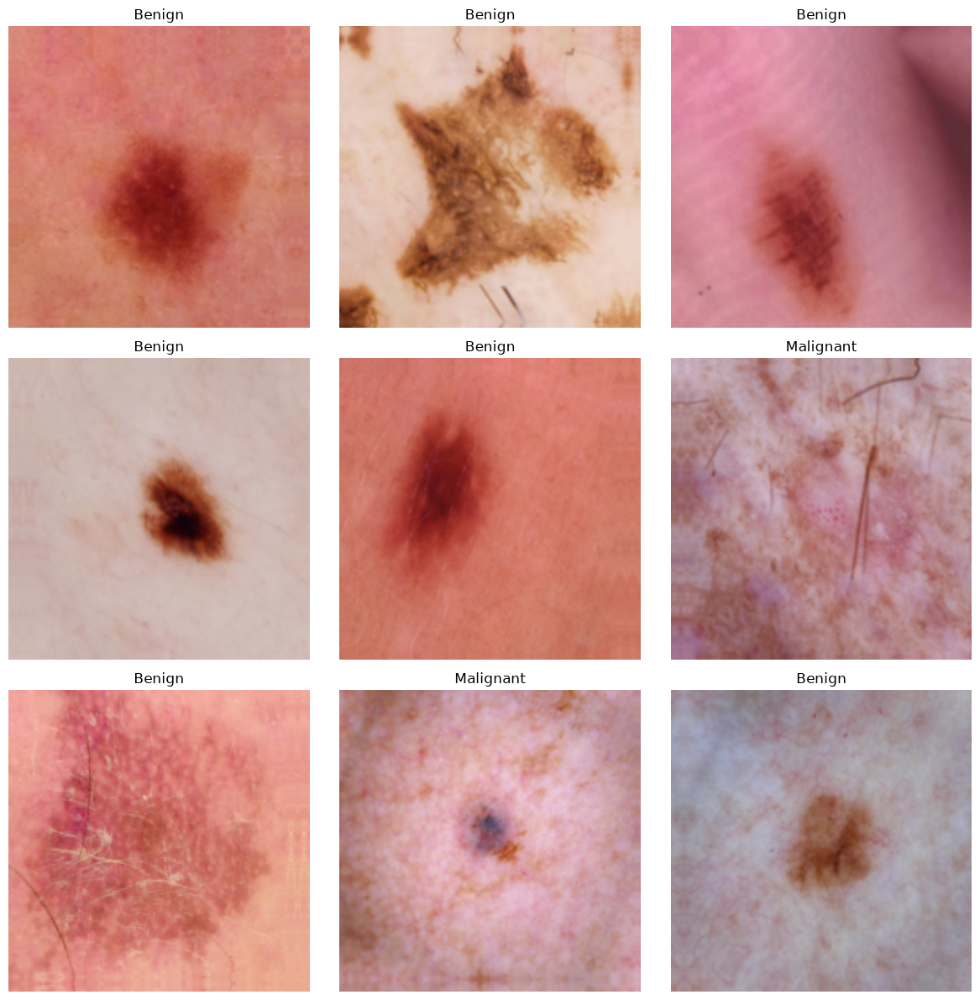

In [25]:
# ============================================
# Visualize Training Images
# ============================================

plt.figure(figsize=(12, 12))

for images, labels in train_ds.take(1):

    for i in range(9):

        plt.subplot(3, 3, i + 1)

        plt.imshow(tf.cast(images[i], tf.uint8))

        plt.title(
            "Malignant" if labels[i] == 1 else "Benign"
        )

        plt.axis("off")

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [5.1653795..109.01976].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.5..104.707886].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [5.1096025..102.84452].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.3119599..100.898926].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [20.302025..116.20504].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.9516929..97.16856].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [6.800703..105.9456].

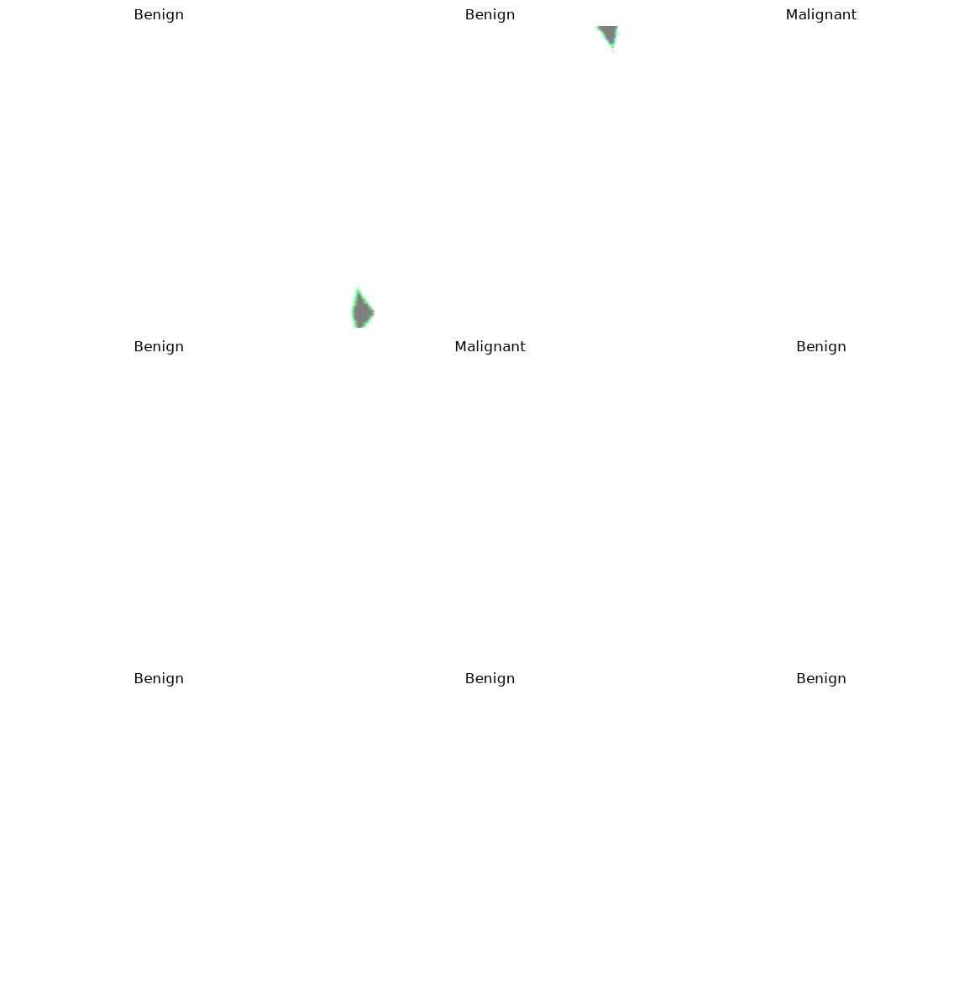

In [26]:
plt.figure(figsize=(12,12))

for images, labels in train_ds.take(1):

    for i in range(9):

        plt.subplot(3,3,i+1)

        plt.imshow((images[i]+1)/2)

        plt.title(
            "Malignant"
            if labels[i]==1
            else "Benign"
        )

        plt.axis("off")

plt.tight_layout()

plt.show()

In [27]:
print(train_df["label"].value_counts())

print(valid_df["label"].value_counts())

print(test_df["label"].value_counts())

label
0    5784
1    1410
Name: count, dtype: int64
label
0    1021
1     249
Name: count, dtype: int64
label
0    1201
1     293
Name: count, dtype: int64


In [28]:
# ============================================
# EfficientNetB0
# ============================================

base_model = tf.keras.applications.EfficientNetB0(

    include_top=False,

    weights="imagenet",

    input_shape=(IMG_SIZE, IMG_SIZE, 3)

)

base_model.trainable = False

In [29]:
# ============================================
# Build Model
# ============================================

inputs = tf.keras.Input(
    shape=(IMG_SIZE, IMG_SIZE, 3)
)

x = base_model(inputs, training=False)

x = GlobalAveragePooling2D()(x)

x = BatchNormalization()(x)

x = Dropout(0.40)(x)

x = Dense(
    256,
    activation="relu"
)(x)

x = Dropout(0.30)(x)

outputs = Dense(
    1,
    activation="sigmoid",
    dtype="float32"
)(x)

model = Model(inputs, outputs)

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,382,884 (16.72 MB)

 Trainable params: 330,753 (1.26 MB)

 Non-trainable params: 4,052,131 (15.46 MB)

In [30]:
# ============================================
# Compile Model
# ============================================

model.compile(

    optimizer=tf.keras.optimizers.Adam(

        learning_rate=1e-4

    ),

    loss=tf.keras.losses.BinaryCrossentropy(

        label_smoothing=0.1

    ),

    metrics=[

        "accuracy",

        tf.keras.metrics.Precision(),

        tf.keras.metrics.Recall(),

        tf.keras.metrics.AUC(name="auc")

    ]

)

In [31]:
# ============================================
# Callbacks
# ============================================

checkpoint = ModelCheckpoint(

    "saved_model/best_model.keras",

    monitor="val_auc",

    save_best_only=True,

    mode="max",

    verbose=1

)

early_stop = EarlyStopping(

    monitor="val_loss",

    patience=10,

    restore_best_weights=True,

    verbose=1

)

reduce_lr = ReduceLROnPlateau(

    monitor="val_loss",

    factor=0.2,

    patience=3,

    min_lr=1e-7,

    verbose=1

)

csv_logger = CSVLogger(

    "saved_model/training_log.csv"
)

callbacks = [

    checkpoint,

    early_stop,

    reduce_lr,

    csv_logger

]

print("Callbacks Ready")

Callbacks Ready


In [32]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.15),
    tf.keras.layers.RandomZoom(0.15),
    tf.keras.layers.RandomContrast(0.15),
], name="Data_Augmentation")

In [33]:
# ============================================
# Stage 1 Training (Frozen EfficientNet)
# ============================================

history_stage1 = model.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=EPOCH_STAGE1,
    class_weight=class_weights,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/20


225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 542ms/step - accuracy: 0.6336 - auc: 0.7136 - loss: 0.7570 - precision: 0.3064 - recall: 0.6879
Epoch 1: val_auc improved from None to 0.84678, saving model to saved_model/best_model.keras

Epoch 1: finished saving model to saved_model/best_model.keras
225/225 ━━━━━━━━━━━━━━━━━━━━ 160s 633ms/step - accuracy: 0.6336 - auc: 0.7136 - loss: 0.7570 - precision: 0.3064 - recall: 0.6879 - val_accuracy: 0.7551 - val_auc: 0.8468 - val_loss: 0.5334 - val_precision: 0.4335 - val_recall: 0.8112 - learning_rate: 1.0000e-04
Epoch 2/20
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step - accuracy: 0.7157 - auc: 0.8086 - loss: 0.6200 - precision: 0.3850 - recall: 0.7539
Epoch 2: val_auc improved from 0.84678 to 0.85188, saving model to saved_model/best_model.keras

Epoch 2: finished saving model to saved_model/best_model.keras
225/225 ━━━━━━━━━━━━━━━━━━━━ 111s 492ms/step - accuracy: 0.7157 - auc: 0.8086 - loss: 0.6200 - precision: 0.3850 - recall: 0.7539 - val_accuracy: 0.7835 

In [34]:
# ============================================
# Fine Tuning
# ============================================

base_model.trainable = True

# Freeze first layers, unfreeze last ~80 layers
for layer in base_model.layers[:-80]:
    layer.trainable = False

print("Trainable Layers:",
      len([l for l in base_model.layers if l.trainable]))

model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-5
    ),
    loss=tf.keras.losses.BinaryCrossentropy(
        label_smoothing=0.1
    ),
    metrics=[
        "accuracy",
        tf.keras.metrics.Precision(),
        tf.keras.metrics.Recall(),
        tf.keras.metrics.AUC(name="auc")
    ]
)

Trainable Layers: 80


In [35]:
# ============================================
# Stage 2 Training
# ============================================

history_stage2 = model.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=EPOCH_STAGE1 + EPOCH_STAGE2,
    initial_epoch=history_stage1.epoch[-1] + 1,
    class_weight=class_weights,
    callbacks=callbacks,
    verbose=1
)

Epoch 21/60


225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 599ms/step - accuracy: 0.6910 - auc: 0.7391 - loss: 0.6785 - precision_1: 0.3409 - recall_1: 0.6177
Epoch 21: val_auc did not improve from 0.87966
225/225 ━━━━━━━━━━━━━━━━━━━━ 162s 669ms/step - accuracy: 0.6910 - auc: 0.7391 - loss: 0.6785 - precision_1: 0.3409 - recall_1: 0.6177 - val_accuracy: 0.7551 - val_auc: 0.8457 - val_loss: 0.5440 - val_precision_1: 0.4292 - val_recall_1: 0.7550 - learning_rate: 1.0000e-05
Epoch 22/60
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 585ms/step - accuracy: 0.7132 - auc: 0.8028 - loss: 0.6092 - precision_1: 0.3832 - recall_1: 0.7596
Epoch 22: val_auc did not improve from 0.87966
225/225 ━━━━━━━━━━━━━━━━━━━━ 146s 647ms/step - accuracy: 0.7132 - auc: 0.8028 - loss: 0.6092 - precision_1: 0.3832 - recall_1: 0.7596 - val_accuracy: 0.7709 - val_auc: 0.8536 - val_loss: 0.5287 - val_precision_1: 0.4502 - val_recall_1: 0.7631 - learning_rate: 1.0000e-05
Epoch 23/60
225/225 ━━━━━━━━━━━━━━━━━━━━ 0s 581ms/step - accuracy: 0.7250 - auc: 0.8300 

In [36]:
# ============================================
# Load Best Saved Model
# ============================================

model = tf.keras.models.load_model(
    "saved_model/best_model.keras"
)

print("Best model loaded successfully.")

Best model loaded successfully.


In [37]:
# ============================================
# Evaluate Model
# ============================================

results = model.evaluate(test_ds, verbose=1)

for name, value in zip(model.metrics_names, results):
    print(f"{name:15}: {value:.4f}")

47/47 ━━━━━━━━━━━━━━━━━━━━ 29s 452ms/step - accuracy: 0.8541 - auc: 0.8980 - loss: 0.4404 - precision_1: 0.6190 - recall_1: 0.6655
loss           : 0.4404
compile_metrics: 0.8541


In [39]:
# ============================================
# Combine Training History (Fixed)
# ============================================

# Rename Stage 2 metric names if TensorFlow added suffixes
rename_map = {
    "precision_1": "precision",
    "recall_1": "recall",
    "val_precision_1": "val_precision",
    "val_recall_1": "val_recall",
    "auc_1": "auc",
    "val_auc_1": "val_auc"
}

for old_name, new_name in rename_map.items():
    if old_name in history_stage2.history:
        history_stage2.history[new_name] = history_stage2.history.pop(old_name)

history = {}

all_keys = sorted(
    set(history_stage1.history.keys()) |
    set(history_stage2.history.keys())
)

for key in all_keys:

    stage1_values = history_stage1.history.get(key, [])
    stage2_values = history_stage2.history.get(key, [])

    history[key] = stage1_values + stage2_values

print("="*60)
print("History Combined Successfully")
print("="*60)

print(history.keys())

History Combined Successfully
dict_keys(['accuracy', 'auc', 'learning_rate', 'loss', 'precision', 'recall', 'val_accuracy', 'val_auc', 'val_loss', 'val_precision', 'val_recall'])


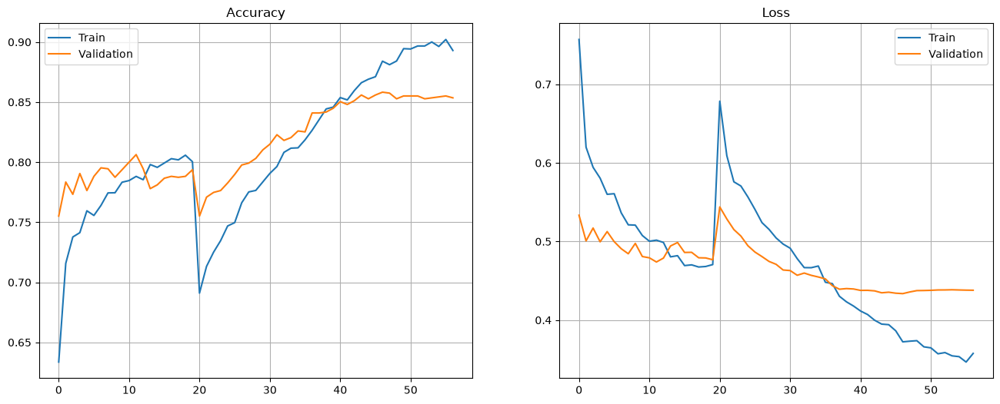

In [40]:
# ============================================
# Accuracy & Loss Curves
# ============================================

fig, ax = plt.subplots(1,2, figsize=(16,6))

ax[0].plot(history["accuracy"], label="Train")
ax[0].plot(history["val_accuracy"], label="Validation")
ax[0].set_title("Accuracy")
ax[0].legend()
ax[0].grid(True)

ax[1].plot(history["loss"], label="Train")
ax[1].plot(history["val_loss"], label="Validation")
ax[1].set_title("Loss")
ax[1].legend()
ax[1].grid(True)

plt.show()

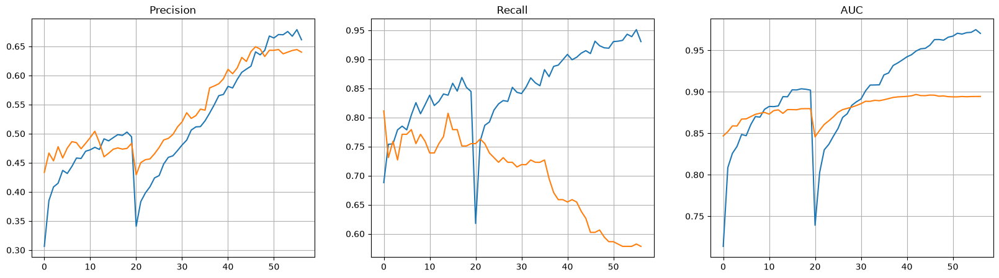

In [41]:
# ============================================
# Precision Recall AUC
# ============================================

fig, ax = plt.subplots(1,3, figsize=(20,5))

ax[0].plot(history["precision"])
ax[0].plot(history["val_precision"])
ax[0].set_title("Precision")
ax[0].grid(True)

ax[1].plot(history["recall"])
ax[1].plot(history["val_recall"])
ax[1].set_title("Recall")
ax[1].grid(True)

ax[2].plot(history["auc"])
ax[2].plot(history["val_auc"])
ax[2].set_title("AUC")
ax[2].grid(True)

plt.show()

In [42]:
# ============================================
# Predictions
# ============================================

y_true = []
y_prob = []

for images, labels in test_ds:

    pred = model.predict(images, verbose=0)

    y_true.extend(labels.numpy())

    y_prob.extend(pred.ravel())

y_true = np.array(y_true)

y_prob = np.array(y_prob)

y_pred = (y_prob > 0.5).astype(int)

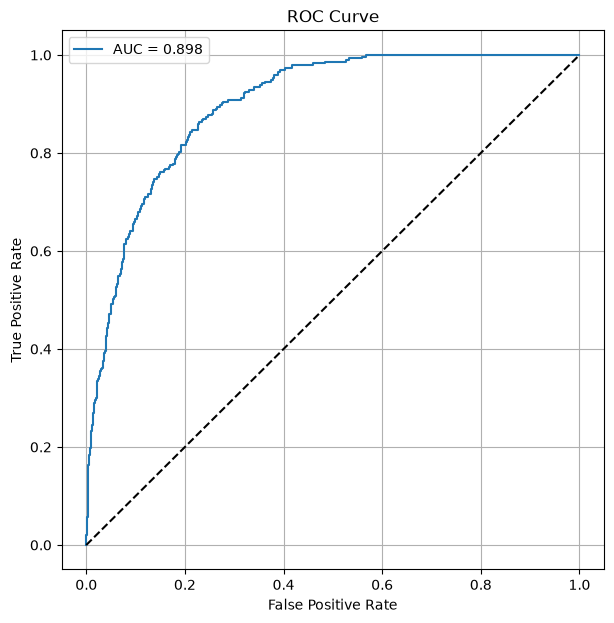

In [43]:
# ============================================
# ROC Curve
# ============================================

fpr, tpr, _ = roc_curve(y_true, y_prob)

roc_auc = roc_auc_score(y_true, y_prob)

plt.figure(figsize=(7,7))

plt.plot(fpr, tpr,
         label=f"AUC = {roc_auc:.3f}")

plt.plot([0,1],[0,1],'k--')

plt.xlabel("False Positive Rate")

plt.ylabel("True Positive Rate")

plt.title("ROC Curve")

plt.legend()

plt.grid(True)

plt.show()

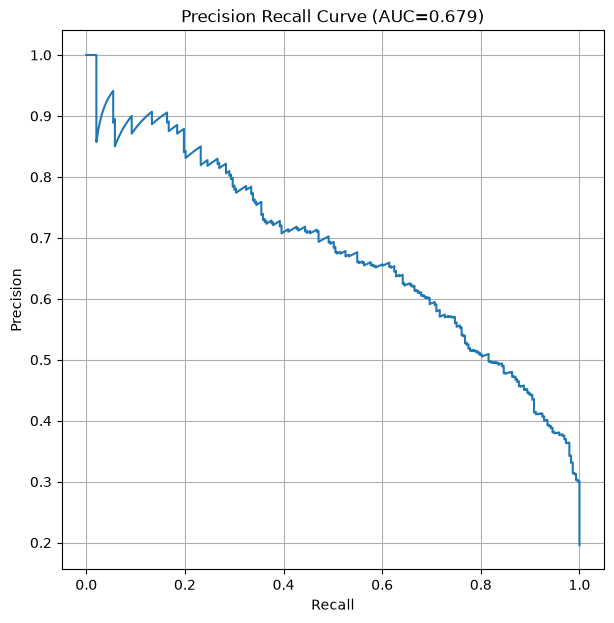

In [44]:
# ============================================
# Precision Recall Curve
# ============================================

precision, recall, _ = precision_recall_curve(
    y_true,
    y_prob
)

pr_auc = auc(recall, precision)

plt.figure(figsize=(7,7))

plt.plot(recall, precision)

plt.title(
    f"Precision Recall Curve (AUC={pr_auc:.3f})"
)

plt.xlabel("Recall")

plt.ylabel("Precision")

plt.grid(True)

plt.show()

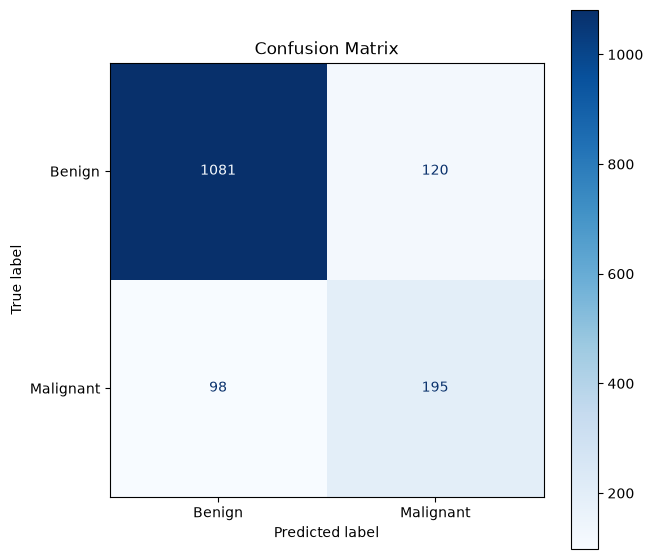

In [46]:
# ============================================
# Confusion Matrix
# ============================================

cm = confusion_matrix(y_true, y_pred)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=["Benign","Malignant"]
)

fig, ax = plt.subplots(figsize=(7,7))

disp.plot(cmap="Blues", ax=ax)

plt.title("Confusion Matrix")

plt.show()

In [47]:
# ============================================
# Classification Report
# ============================================

print(classification_report(
    y_true,
    y_pred,
    target_names=[
        "Benign",
        "Malignant"
    ]
))

              precision    recall  f1-score   support

      Benign       0.92      0.90      0.91      1201
   Malignant       0.62      0.67      0.64       293

    accuracy                           0.85      1494
   macro avg       0.77      0.78      0.77      1494
weighted avg       0.86      0.85      0.86      1494



In [48]:
# ============================================
# Save Final Model
# ============================================

os.makedirs("saved_model", exist_ok=True)

model.save("saved_model/skin_cancer_binary.keras")

model.save("saved_model/skin_cancer_binary.h5")

print("="*60)
print("Model Saved Successfully")
print("="*60)

Model Saved Successfully


In [49]:
# ============================================
# Save Training History
# ============================================

history_df = pd.DataFrame(history)

history_df.to_csv(
    "saved_model/training_history.csv",
    index=False
)

history_df.head()

,accuracy,auc,learning_rate,loss,precision,recall,val_accuracy,val_auc,val_loss,val_precision,val_recall
0,0.633584,0.713632,0.0001,0.757038,0.306380,0.687943,0.755118,0.846784,0.533443,0.433476,0.811245
1,0.715735,0.808568,0.0001,0.620014,0.385005,0.753901,0.783465,0.851880,0.500747,0.466667,0.730924
2,0.737698,0.825770,0.0001,0.594390,0.408445,0.754610,0.773228,0.858865,0.517125,0.453237,0.759036
3,0.741312,0.834070,0.0001,0.580573,0.414809,0.778723,0.790551,0.858720,0.499619,0.477573,0.726908
4,0.759522,0.848553,0.0001,0.560057,0.436859,0.785106,0.776378,0.867084,0.512612,0.458234,0.771084


In [50]:
# ============================================
# Single Image Prediction
# ============================================

CLASS_NAMES = {
    0: "Benign",
    1: "Malignant"
}


def predict_image(image_path):

    image = tf.keras.preprocessing.image.load_img(
        image_path,
        target_size=(IMG_SIZE, IMG_SIZE)
    )

    img = tf.keras.preprocessing.image.img_to_array(image)

    img = img / 255.0

    img = np.expand_dims(img, axis=0)

    prediction = model.predict(img, verbose=0)[0][0]

    predicted_class = 1 if prediction >= 0.5 else 0

    confidence = prediction if predicted_class == 1 else (1-prediction)

    plt.figure(figsize=(6,6))

    plt.imshow(image)

    plt.axis("off")

    plt.title(
        f"Prediction : {CLASS_NAMES[predicted_class]}\n"
        f"Confidence : {confidence*100:.2f}%"
    )

    plt.show()

    print("="*60)
    print("Prediction :", CLASS_NAMES[predicted_class])
    print("Confidence :", round(confidence*100,2),"%")
    print("Raw Probability :", prediction)
    print("="*60)

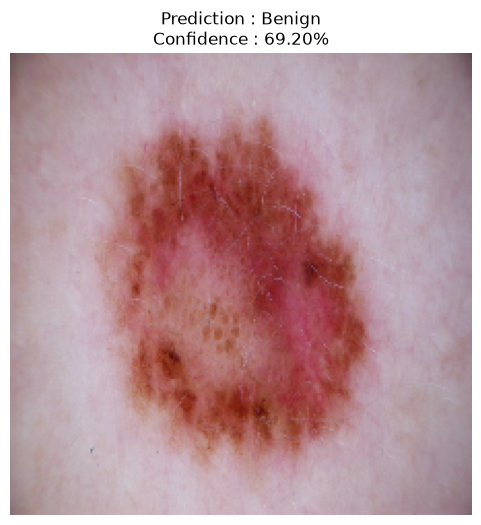

Prediction : Benign
Confidence : 69.2 %
Raw Probability : 0.30802673


In [51]:
# ============================================
# Test Prediction
# ============================================

sample_image = test_df.sample(1).iloc[0]["image_path"]

predict_image(sample_image)

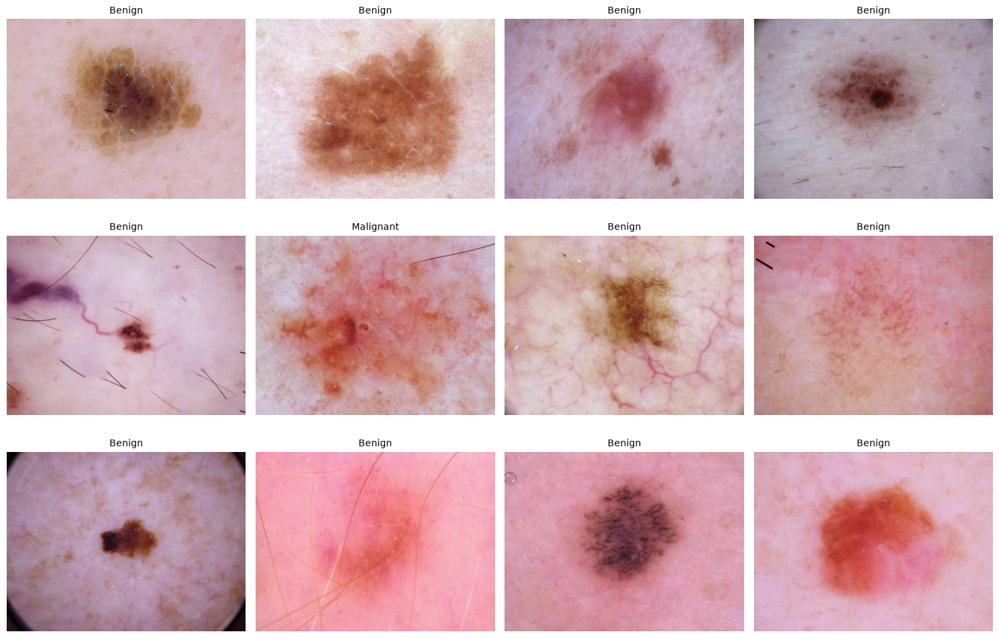

In [52]:
# ============================================
# Correct Predictions
# ============================================

correct = np.where(y_true == y_pred)[0]

plt.figure(figsize=(15,10))

for i, idx in enumerate(correct[:12]):

    path = test_df.iloc[idx]["image_path"]

    image = Image.open(path)

    plt.subplot(3,4,i+1)

    plt.imshow(image)

    plt.title(
        CLASS_NAMES[y_pred[idx]],
        fontsize=10
    )

    plt.axis("off")

plt.tight_layout()

plt.show()

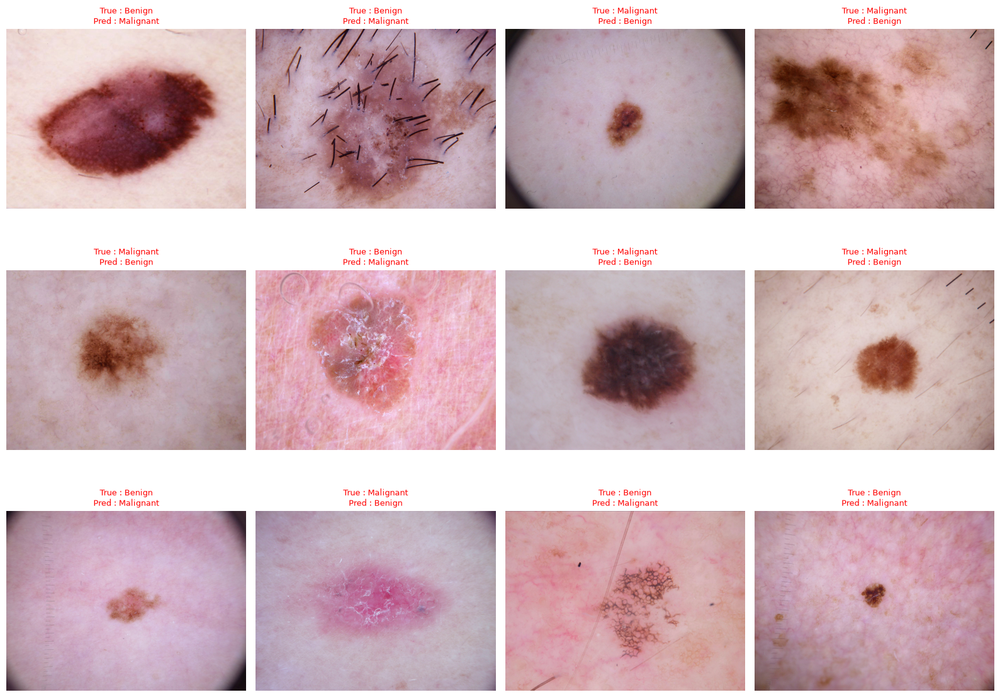

In [53]:
# ============================================
# Wrong Predictions
# ============================================

wrong = np.where(y_true != y_pred)[0]

plt.figure(figsize=(16,12))

for i, idx in enumerate(wrong[:12]):

    path = test_df.iloc[idx]["image_path"]

    image = Image.open(path)

    plt.subplot(3,4,i+1)

    plt.imshow(image)

    plt.title(
        f"True : {CLASS_NAMES[y_true[idx]]}\n"
        f"Pred : {CLASS_NAMES[y_pred[idx]]}",
        fontsize=9,
        color="red"
    )

    plt.axis("off")

plt.tight_layout()

plt.show()

In [54]:
# ============================================
# Final Scores
# ============================================

from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_true, y_pred)

auc_score = roc_auc_score(y_true, y_prob)

print("="*60)

print("Final Accuracy :", round(accuracy*100,2),"%")

print("Final ROC AUC :", round(auc_score,4))

print("="*60)

Final Accuracy : 85.41 %
Final ROC AUC : 0.8981


In [55]:
# ============================================
# Best Metrics
# ============================================

print("Best Validation Accuracy")

print(max(history["val_accuracy"]))

print()

print("Best Validation AUC")

print(max(history["val_auc"]))

print()

print("Lowest Validation Loss")

print(min(history["val_loss"]))

Best Validation Accuracy
0.8582677245140076

Best Validation AUC
0.8967859745025635

Lowest Validation Loss
0.4336809813976288


In [56]:
# ============================================
# Save Model Architecture
# ============================================

tf.keras.utils.plot_model(
    model,
    show_shapes=True,
    dpi=120,
    to_file="saved_model/model_architecture.png"
)

print("Architecture Saved")

You must install pydot (`pip install pydot`) for `plot_model` to work.
Architecture Saved


In [57]:
# ============================================
# Export Predictions
# ============================================

prediction_df = test_df.copy()

prediction_df["Prediction"] = y_pred

prediction_df["Probability"] = y_prob

prediction_df["Predicted_Label"] = prediction_df["Prediction"].map(CLASS_NAMES)

prediction_df.to_csv(
    "saved_model/test_predictions.csv",
    index=False
)

prediction_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,label,binary_class,image_path,Prediction,Probability,Predicted_Label
918,HAM_0005463,ISIC_0028411,bkl,consensus,45.0,male,back,0,Benign,Dataset\HAM10000_images_part_1\ISIC_0028411.jpg,0,0.159185,Benign
7942,HAM_0001801,ISIC_0033909,nv,histo,35.0,female,abdomen,0,Benign,Dataset\HAM10000_images_part_2\ISIC_0033909.jpg,0,0.288683,Benign
9407,HAM_0000556,ISIC_0034279,nv,consensus,50.0,female,upper extremity,0,Benign,Dataset\HAM10000_images_part_2\ISIC_0034279.jpg,0,0.067766,Benign
7857,HAM_0006182,ISIC_0033789,nv,histo,35.0,male,abdomen,0,Benign,Dataset\HAM10000_images_part_2\ISIC_0033789.jpg,0,0.096310,Benign
9095,HAM_0001701,ISIC_0025237,nv,histo,65.0,male,lower extremity,0,Benign,Dataset\HAM10000_images_part_1\ISIC_0025237.jpg,0,0.031145,Benign


In [58]:
# ============================================
# Project Summary
# ============================================

print("="*70)

print("Skin Cancer Binary Classification Completed")

print()

print("Dataset : HAM10000")

print("Model : EfficientNet-B0")

print("Image Size :", IMG_SIZE)

print("Epochs :", EPOCH_STAGE1 + EPOCH_STAGE2)

print("Batch Size :", BATCH_SIZE)

print("Optimizer : Adam")

print("Loss : Binary Crossentropy")

print()

print("Outputs Saved Inside")

print("saved_model/")

print("="*70)

Skin Cancer Binary Classification Completed

Dataset : HAM10000
Model : EfficientNet-B0
Image Size : 224
Epochs : 60
Batch Size : 32
Optimizer : Adam
Loss : Binary Crossentropy

Outputs Saved Inside
saved_model/


# 🎉 Training Completed Successfully

## Outputs Generated

- ✅ Trained EfficientNet-B0 Model
- ✅ Best Model (.keras)
- ✅ H5 Model
- ✅ Training History CSV
- ✅ Test Predictions CSV
- ✅ ROC Curve
- ✅ Precision-Recall Curve
- ✅ Confusion Matrix
- ✅ Classification Report
- ✅ Accuracy, Loss, Precision, Recall & AUC Graphs
- ✅ Misclassified Images Visualization
- ✅ Single Image Prediction Function

---

## Future Improvements

- EfficientNet-B3 / B4
- Test Time Augmentation (TTA)
- Grad-CAM Visualization
- K-Fold Cross Validation
- Focal Loss for Imbalanced Data
- Ensemble Models

In [2]:
import tensorflow as tf

model = tf.keras.models.load_model("saved_model/best_model.keras")

In [3]:
model.summary(expand_nested=True)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ input_layer_1 (InputLayer) │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ rescaling (Rescaling)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ normalization              │ (None, 224, 224, 3)    │             7 │
│ (Normalization)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ rescaling_1 (Rescaling)    │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ stem_conv_pad              │ (None, 225, 225, 3)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ stem_conv (Conv2D)         │ (None, 112, 112, 32)   │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ stem_bn                    │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ stem_activation            │ (None, 112, 112, 32)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_dwconv             │ (None, 112, 112, 32)   │           288 │
│ (DepthwiseConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_bn                 │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_activation         │ (None, 112, 112, 32)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_se_squeeze         │ (None, 32)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_se_reshape         │ (None, 1, 1, 32)       │             0 │
│ (Reshape)                       │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_se_reduce (Conv2D) │ (None, 1, 1, 8)        │           264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_se_expand (Conv2D) │ (None, 1, 1, 32)       │           288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_se_excite          │ (None, 112, 112, 32)   │             0 │
│ (Multiply)                      │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_project_conv       │ (None, 112, 112, 16)   │           512 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 11,506,848 (43.90 MB)

 Trainable params: 3,561,981 (13.59 MB)

 Non-trainable params: 820,903 (3.13 MB)

 Optimizer params: 7,123,964 (27.18 MB)